In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import plotly.express as px
from scipy.stats import norm
from sklearn.linear_model import LinearRegression
from scipy import optimize

# Introduction to numerical methods

János Török

# Class 7: Random numbers and error propagation

# Random numbers
Where we need random numbers:
 * Cryptography
 * Numerical simulations of stochastic phenomena
 * Stochastic numerical methods (e.g. Monte-Carlo integration)
 
Requirements:
 * Cryptography
   - Uncorrelated
   - Truly random
   - Unreproducible
   - Not too frequently
 * Numerical simulations
   - Fast
   - Faster!
   - Many
   - Uncorrelated
   - Reproducible (for debugging!)

## True random numbers
<b>Source: Physical phenomena</b>
 * Shot noise (circuit)
 * Nuclear decay (radioactive material and Geiger-Müller counter)
 * Atmospheric noise
 * <a href="https://en.wikipedia.org/wiki/Lavarand">Lava lamps</a>
 
<b>Advantages</b>
 * Truly unpredictable
 
<b>Disadvantages</b>
 * Slow
 * Expensive

<table><tr>
<td> <img src="class07/device.jpeg" style="height: 250px;"/> </td>
<td> <img src="class07/lava_lamp.jpg" style="height: 250px;"/> </td>
</tr></table>

## Pseudo random numbers

Random numbers generated by an <b>algorithm</b>.

<b>Advantages</b>
 * Fast
 * Deterministic
 * Cheap
 * Can be parallelized
 * Can be made reliable
 * Reproducible (good for debugging)

<b>Disadvantages</b>
 * Limited limit cycle
 * Can be a liability for security in cryptographic applications

## Algorithms
### Requirements
 * Performance
 * Precision
 * Limit cycle
 * Randomness
<img src="class07/random_number.png" style="width: 350px;"/> 
<img src="class07/dilbert.jpg" style="width: 650px;"/>


### Multiplicative congruential algorithm
 *  Let $r_j$ be an integer number, the next is generated by
$$r_{j+1}=(ar_j+c)~\text{mod}~(m),$$
 *  Sometimes only $k$ bits are used
 *  Values between $0$ and $m-1$ or $2^k-1$
 *  Three parameters ($a,c,m$).
 *  If $m=2^X$ is fast. Use AND (\&) instead of modulo (\%).
 *  Good:
   *  Historical choice: $a=7^5=16807$, $m=2^{31}-1=2147483647$, $c=0$
   *  gcc built-in ($k=31$): $a=1103515245$, $m=2^{31}=2147483648$, $c=12345$
 *  Bad (used to be the default on IBM computers):
   *  RANDU: $a=65539$, $m=2^{31}=2147483648$, $c=0$


In [2]:
def MCA_modulus(x,a = 16807, m = 2**31-1, c = 0):
    return (a*x+c) % m

In [3]:
def MCA_and(x,a = 1103515245, m = 2**31-1, c = 12345):
    return (a*x+c) & m

In [4]:
%%timeit
x = 123412425
for _ in range(100000):
    x = MCA_modulus(x)

17.9 ms ± 381 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [5]:
%%timeit
x = 123412425
for _ in range(100000):
    x = MCA_and(x)

13.8 ms ± 117 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


### Permuted congruential algorithm
 *  Let $r$ be an integer number, the next is generated by
   *  $count = r >> 61$: The topmost three bits as a number
   *  $r_{j+1}=(ar_j+c)\text{mod}(m)$: A multiplicative congruential
step, generally, with $m=2^{64}$.
   *  $r = r~\mathrm{XOR}~(r >>22)$: An XOR operation of $r$ with its
cyclic shifted self
   *  $r=r>>(22+count)$ cyclic shift of $r$
   *  return $r$
 *  A variant of this is used by numpy


## Tests

 *  Birthday spacings (spacing is exponential)
 *  Monkey tests (random typewriter problem)
 *  Parking lot test
 *  Moments:
 $$\displaystyle m=\int_0^1\frac{1}{n+1}$$
 *  Correlation
 $$C_{q,q'}(t)=
\int_0^1\int_0^1x^qx'^{q'} P[x,x'(t)]dx dx'=
\frac{1}{(q+1)(q'+1)}$$
 *  Fourier-spectra
 *  Fill of $d$ dimensional lattice
 *  Random walks


### Failed tests

RANDU with fill 3d Space


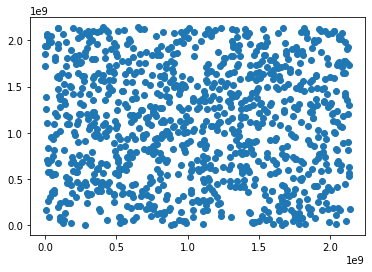

In [6]:
# 2d
x = []
y = []
r = 12345
for _ in range(1000):
    r = MCA_and(r,a=65539, c=0)
    x.append(r)
    r = MCA_and(r,a=65539, c=0)
    y.append(r)
plt.scatter(x,y)

In [7]:
# 3d
x = []
y = []
z = []
r = 12345
for _ in range(10000):
    r = MCA_and(r,a=65539, c=0)
    x.append(r)
    r = MCA_and(r,a=65539, c=0)
    y.append(r)
    r = MCA_and(r,a=65539, c=0)
    z.append(r)

In [8]:
fig = px.scatter_3d(x=x, y=y, z=z)
fig.update_layout(showlegend=False)
fig.update_traces(marker=dict(size=3))
fig.show()

### Marsaglia effect
When the points generated randomly fall on specific subplanes, it is called Marsaglia effect

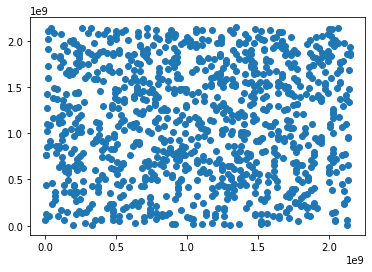

In [9]:
# 2d
a = 99
c = 77
x = []
y = []
r = 12345
for _ in range(1000):
    r = MCA_and(r,a=a, c=c)
    x.append(r)
    r = MCA_and(r,a=a, c=c)
    y.append(r)
plt.scatter(x,y)

In [10]:
# 3d
a = 99
c = 77
x = []
y = []
z = []
r = 12345
for _ in range(10000):
    r = MCA_and(r,a=a, c=c)
    x.append(r)
    r = MCA_and(r,a=a, c=c)
    y.append(r)
    r = MCA_and(r,a=a, c=c)
    z.append(r)

In [11]:
fig = px.scatter_3d(x=x, y=y, z=z)
fig.update_layout(showlegend=False)
fig.update_traces(marker=dict(size=3))
fig.show()

In [12]:
r = 12345

In [13]:
v = []
for _ in range(1000000):
    r = MCA_and(r,a=a, c=c)
    v.append(r/2**31)

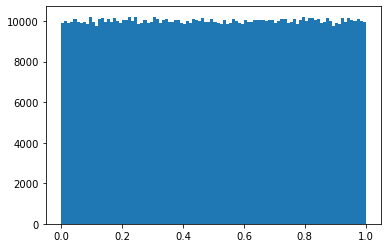

In [14]:
plt.hist(v,bins=100);

In [15]:
((np.array(v)-0.5)**2).mean()-1/12

-1.9532554317774897e-05

In [16]:
np.array(v).var()-1/12

-1.958362369684774e-05

In [17]:
np.array(np.random.random(1000000)).var()-1/12

3.724969230198272e-05

#### Monkey test
How many keystrokes one needs to get a character sequence on a typewriter. Let us assume we have 26 keys, the uppercase letters from A to Z. How many keystrokes are there between two words of `CAT`? There are  $26^3 = 17~576$ possible 3-letter words, so the average keystroke between two `CAT` words should be $17576$.

In [18]:
v = ""
for _ in range(10000000):
    r = MCA_and(r,a=a, c=c)
    v = v + chr(int(r/2**31 * 26)+65)

In [19]:
i = 0
dp = []
while True:
    j = v[i:].find('CAT')
    if j == -1: break
    dp.append(j)
    i += j + 1

In [20]:
np.array(dp).mean()

15908.06050955414

In [21]:
i = 0
dp = []
while True:
    j = v[i:].find('ZZZ')
    if j == -1: break
    dp.append(j)
    i += j + 1

In [22]:
np.array(dp).mean()

15470.215503875968

In [23]:
i = 0
dp = []
while True:
    j = v[i:].find('AAA')
    if j == -1: break
    dp.append(j)
    i += j + 1

In [24]:
np.array(dp).mean()

16234.569558101473

In [25]:
v1 = -1
v2 = -1
dp = []
j = 0
for i in range(10000000):
    r = MCA_and(r,a=a, c=c)
    v = int(r/2**31 * 26)
    if v == v1 and v == v2 and v1 == v2:
        dp.append(i-j)
        j = i
    v2 = v1
    v1 = v

In [26]:
np.array(dp).mean(),26*26

(650.7845893531173, 676)

#### Conclusion
The MCA with $a=99$, $c=77$ does not pass the Monkey test

## Seed
Can be taken from
 * True random source (should be the case for cryptographic purposes!)
 * Time: default option, do not use it:
   - Debugging is hard/impossible
   - Runs close in time are correlated
   - Batch runs on CPU clusters will be identical since time is sinchronized
 * Manual: preferred way in scientific simulations
   - Reproducible (debugging is possible)
   - Seeds must be uncorrelated and should be saved
   - Must ensure that each copy runs with a different seed

#### Demonstration of seed importance
Using a good MCA, first numbers after each other, then using successive seeds

In [27]:
N = 100
A = np.zeros((N,N),dtype=float)
r = 12345
for i in range(N):
    for j in range(N):
        r = MCA_modulus(r)
        A[i,j] = r

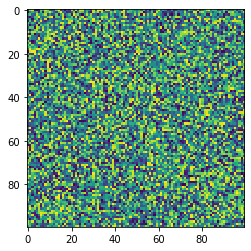

In [28]:
plt.imshow(A)

In [29]:
N = 100
A = np.zeros((N,N),dtype=float)
seed = 0
for i in range(N):
    for j in range(N):
        r = MCA_modulus(seed)
        A[i,j] = r
        seed += 1

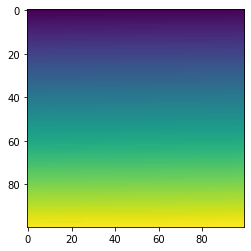

In [30]:
plt.imshow(A)

In [31]:
N = 100
A = np.zeros((N,N),dtype=float)
r = 12345
for i in range(N):
    for j in range(N):
        r = MCA_and(r)
        A[i,j] = r

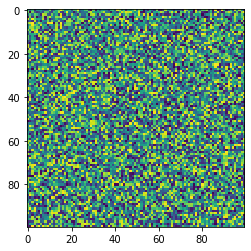

In [32]:
plt.imshow(A)

In [33]:
N = 100
A = np.zeros((N,N),dtype=float)
seed = 0
for i in range(N):
    for j in range(N):
        r = MCA_and(seed)
        A[i,j] = r
        seed += 1

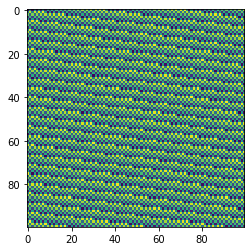

In [34]:
plt.imshow(A)

## Different distributions, Inverse transform sampling
Let us have A random variable $X\in\mathbb{R}$. The probability density function is $f(X)$ The cumulative distribution is always between 0 and 1
$$F(X)=\int_{-\infty}^Xf(X')dX'$$
From $U \sim \mathrm{Unif}[0,1]$, we want to generate $X$ with Cumulative distribution function $F_X(x).$ We assume $F_X(x)$ to be a continuous, strictly increasing function, which provides good intuition. We want to see if we can find some strictly monotone transformation $T:[0,1]\mapsto \mathbb{R}$, such that $T(U)\overset{d}{=}X$. We will have

$F_X(x)=\Pr(X\leq x)=\Pr(T(U)\leq x) = \Pr(U\leq T^{-1}(x))=T^{-1}(x), \text{ for } x\in \mathbb{R},$

where the last step used that $\Pr(U \leq y) = y$ when $U$ is uniform on $[0,1]$.

So we got $F_X$ to be the inverse function of $T $, or, equivalently $T(u)=F_X^{-1}(u), u\in [0,1]. $
The   $F^{-1}(x)$ is the inverse function of $F(x)$ not always easy to get!

<b>A soluable example</b>

$$
\begin{align*}
f(x)&=\frac{1}{\pi}\frac{1}{1+x^2}\cr
F(x)&=\frac{1}{\pi}\int_{-\infty}^{x}\frac{1+x'^2}dx'=
\frac{1}{2}+\frac{1}{\pi}\mathrm{arctan}(x)\cr
x&=F^{-1}(y)=\tan\left[\pi(y-1/2)\right]
\end{align*}
$$

<img src="class07/Dprobdist.png" width=600px>


#### Let us test with the soluable example

In [35]:
N = 100000
y = np.random.random(N)
x = np.tan(np.pi*(y-0.5))

In [36]:
bins = np.linspace(-10,10,100)
h,b = np.histogram(x,bins=bins,density=True)

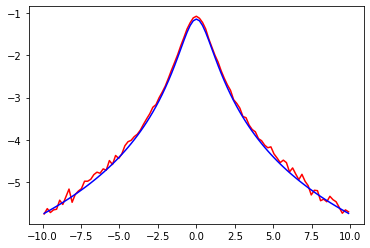

In [37]:
xpos = (bins[1:] + bins[:-1])/2
plt.plot(xpos,np.log(h),"r-")
plt.plot(xpos,np.log(1/(1+xpos**2)/np.pi),"b-")

## Box-Müller method
For Gaussian (normal) distribution there is a simpler way. Consider $(x,y)$ a pair of independent standard normally distributed random numbers. Then the probability density for the pair is a product:
$$f(x,y)=\frac{1}{\sqrt{2\pi}}e^{-x^2/2}\frac{1}{\sqrt{2\pi}}e^{-y^2/2}=\frac{1}{2\pi}e^{-(x^2+y^2)/2}.$$
Since this density is radially symmetric, it is natural to consider the polar coordinate random variables $(r,\varphi)$ defined by $0\leq\varphi<2\pi$ and $x=r\cos(\varphi)$, $y=r\sin(\varphi)$. The variable $\varphi$ is uniformly distributed in the interval $[0,2\pi]$ and may be sampled using
$$\varphi = 2\pi U_1,$$
where $U_1$ is a standard uniform random number distributed between $[0,1]$.
Let us calculate the cumulative radial distribution function:
$$G(r)=P(r'\leq r)=\frac{1}{2\pi}\int_{0}^rdr'\int_0^{2\pi} d\varphi r' e^{-r'^2/2}=
\int_{0}^r r' e^{-r'^2/2}dr'=1-e^{-r^2/2}.$$
We can sample 
$$G(r) = 1-e^{-r^2/2}=1-U_2$$
using $U_2$, an other independent uniform random number distributed between $[0,1]$. Which gives $r=\sqrt{-2\log(U_2)}$.
So we neet do generate 

In [38]:
N = 100000
g = np.zeros((N,2),dtype=float)
x = np.random.random((N,2))
# Make sure that x[:,0] is not zero. Please not that it may be!!!
while ((x[:,1] == 0).sum()):
    x[x[:,1] == 0,1] = np.random.random((x[:,1] == 0).sum())
g[:,0] = np.sqrt(-2*np.log(x[:,0])) * np.cos(2*np.pi*x[:,1])
g[:,1] = np.sqrt(-2*np.log(x[:,0])) * np.sin(2*np.pi*x[:,1])

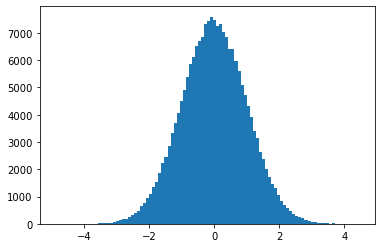

In [39]:
plt.hist(g.flatten(),bins=100);

## Exercise 2
Shuffle pack of cards, i.e. random shuffle the elements of a list. The allowed operation is swapping two elements of the list, in order
refrain from memory allocation overhead. What is the best method? How many operations do you need?

### Solution 1
Shuffle twice as many times as number of elements, measure the probability that an element remaind at its original place, which should be 
$1/N$.

In [40]:
N = 20
sample = 10000
stat = np.zeros(N,dtype=int)
for _ in range(sample):
    x = np.arange(N)
    for i in range(2*N):
        a = np.random.randint(0,N)
        b = np.random.randint(0,N)
        if a != b:
            y = x[a]
            x[a] = x[b]
            x[b] = y
    stat += x == np.arange(N) 

In [41]:
stat,stat.mean(), sample/N

(array([685, 604, 671, 640, 646, 610, 641, 629, 617, 633, 627, 652, 635,
        598, 605, 609, 654, 655, 644, 644]),
 634.95,
 500.0)

The above gets even worse if we increase $N$. The reason behind this is the birthday paradox, namely, that we often choose the same indices and many are not chosen  at all.

### Solution 2
One of the indicise of the swap goes linearly through the system, the other is chosen randomly.

In [42]:
N = 20
sample = 100000
stat = np.zeros(N,dtype=int)
for _ in range(sample):
    x = np.arange(N)
    for i in range(N):
        a = np.random.randint(N)
        y = x[a]
        x[a] = x[i]
        x[i] = y
    stat += x == np.arange(N)

In [43]:
stat,stat.mean(), sample/N

(array([4986, 4914, 4739, 4542, 4528, 4510, 4239, 4261, 4392, 4225, 4359,
        4315, 4334, 4362, 4523, 4589, 4663, 4618, 4788, 4942]),
 4541.45,
 5000.0)

Here the probability that elements ramain at their original place is lower than it should be. The reason is that when the loop is after $i$ and the original element of position $i$ is before $i$ then it cannot return to the original position. This happend most in the middle.

### Solution 3 (the good one!)
The only possible way of randomly shuffling a pack of cards is the following operation: Take a random card from the pack (we know that we can generate a truly random number) and place this card in a new pack. Then from the remaining $N-1$ cards take one randomly and repeat until all cards are moved to the second pack. If we plan carefully we can do this in a single pack: at step $i$ we take one card randomly from the top $N-i$ cards and the place it to the bottom, or to position $i$. The code below does this:

In [44]:
N = 20
sample = 100000
stat = np.zeros(N,dtype=int)
for _ in range(sample):
    x = np.arange(N)
    for i in range(N-1):
        a = np.random.randint(i,N)
        y = x[a]
        x[a] = x[i]
        x[i] = y
    stat += x == np.arange(N)

In [45]:
stat,stat.mean(), sample/N

(array([4846, 5064, 5040, 5022, 5000, 4952, 5048, 4931, 4925, 5148, 5006,
        4978, 5066, 5027, 5131, 4943, 4962, 4983, 5003, 5125]),
 5010.0,
 5000.0)

# Fitting

Given a set of independent data points $x_i$ and dependent data points $y_i, i = 1, \ldots, m$, we would like to find an **estimation function**, $\hat{y}(x)$, that describes the data as well as possible. Note that $\hat{y}$ can be a function of several variables, but for the sake of this discussion, we restrict the domain of $\hat{y}$ to be a single variable. In least squares regression, the estimation function must be a linear combination of **basis functions**, $f_i(x)$. That is, the estimation function must be of the form
$$
\hat{y}(x) = \sum_{i = 1}^n {\alpha}_i f_i(x)
$$
The scalars ${\alpha}_i$ are referred to as the **parameters** of the estimation function, and each basis function must be linearly independent from the others. In other words, in the proper "functional space" no basis function should be expressible as a linear combination of the other functions. Note: In general, there are significantly more data points, $m$, than basis functions, $n$ (i.e., $m \gg n$).

**TRY IT!** 
Create an estimation function for the force-displacement relationship of a linear spring. Identify the basis function(s) and model parameters. 

The relationship between the force, $F$, and the displacement, $x$, can be described by the function $F(x) = kx$ where $k$ is the spring stiffness. The only basis function is the function $f_1(x) = x$ and the model parameter to find is ${\alpha}_1 = k$.

The goal of **least squares regression** is to find the parameters of the estimation function that minimize the **total squared error**, $E$, defined by
$$E = \sum_{i=1}^m (\hat{y} - y_i)^2.$$
The **individual errors** or **residuals** are defined as $e_i = (\hat{y} - y_i)$. If $e$ is the vector containing all the individual errors, then we are also trying to minimize $E = \|{e}\|_{2}^{2}$, which is the $L_2$ norm defined in the previous chapter.

In the next two sections we derive the least squares method of finding the desired parameters. The first derivation comes from linear algebra, and the second derivation comes from multivariable calculus. Although they are different derivations, they lead to the same least squares formula. You are free to focus on the section with which you are most comfortable.

First, we enumerate the estimation of the data at each data point $x_i$

\begin{eqnarray*}
&&\hat{y}(x_1) = {\alpha}_1 f_1(x_1) + {\alpha}_2 f_2(x_1) + \cdots + {\alpha}_n f_n(x_1), \\
&&\hat{y}(x_2) = {\alpha}_1 f_1(x_2) + {\alpha}_2 f_2(x_2) + \cdots + {\alpha}_n f_n(x_2), \\
&&\qquad\qquad \qquad \qquad \quad \cdots\\
&&\hat{y}(x_m) = {\alpha}_1 f_1(x_m) + {\alpha}_2 f_2(x_m) + \cdots + {\alpha}_n f_n(x_m).\end{eqnarray*}

Let $X\in {\Bbb R}^n$ be a column vector such that the $i$-th element of $X$ contains the value of the $i$-th $x$-data point, $x_i, \hat{Y}$ be a column vector with elements, $\hat{Y}_i = \hat{y}(x_i), {\beta}$ be a column vector such that ${\beta}_i = {\alpha}_i, F_i(x)$ be a function that returns a column vector of $f_i(x)$ computed on every element of $x$, and $A$ be an $m \times n$ matrix such that the $i$-th column of $A$ is $F_i(x)$. Given this notation, the previous system of equations becomes $\hat{Y} = A{\beta}$.

Now if $Y$ is a column vector such that $Y_i = y_i$, the total squared error is given by $E = \|{\hat{Y} - Y}\|_{2}^2$. You can verify this by substituting the definition of the $L_2$ norm. Since we want to make $E$ as small as possible and norms are a measure of distance, this previous expression is equivalent to saying that we want $\hat{Y}$ and $Y$ to be a "close as possible." Note that in general $Y$ will not be in the range of $A$ and therefore $E > 0$.

Consider the following simplified depiction of the range of $A$; see the following figure. Note this is $\it not$ a plot of the data points $(x_i, y_i)$.

From observation, the vector in the range of $A, \hat{Y}$, that is closest to $Y$ is the one that can point perpendicularly to $Y$. Therefore, we want a vector $Y - \hat{Y}$ that is perpendicular to the vector $\hat{Y}$.

Recall from Linear Algebra that two vectors are perpendicular, or orthogonal, if their dot product is 0. Noting that the dot product between two vectors, $v$ and $w$, can be written as ${\text{dot}}(v,w) = v^T w$, we can state that $\hat{Y}$ and $Y - \hat{Y}$ are perpendicular if ${\text{dot}}(\hat{Y}, Y - \hat{Y}) = 0$; therefore, $\hat{Y}^T (Y - \hat{Y}) = 0$, which is equivalent to $(A{\beta})^T(Y - A{\beta}) = 0$.

Noting that for two matrices $A$ and $B, (AB)^T = B^T A^T$ and using distributive properties of vector multiplication, this is equivalent to ${\beta}^T A^T Y - {\beta}^T A^T A {\beta} = {\beta}^T(A^T Y - A^T A {\beta}) = 0$. The solution, ${\beta} = \textbf{0}$, is a trivial solution, so we use $A^T Y - A^T A {\beta} = 0$ to find a more interesting solution. Solving this equation for ${\beta}$ gives the $\textbf{least squares regression formula}$:

$$
{\beta} = (A^T A)^{-1} A^T Y
$$

Note that $(A^T A)^{-1}A^T$ is called the **pseudo-inverse** of $A$ and exists when $m > n$ and $A$ has linearly independent columns. Proving the invertibility of $(A^T A)$ is outside the scope of this book, but it is always invertible except for some pathological cases.

Recall that the total error for $m$ data points and $n$ basis functions is:

$$
E = \sum_{i=1}^m e_i^2 = \sum_{i=1}^m (\hat{y}(x_i) - y_i)^2 = \sum_{i=1}^m \left(\sum_{j=1}^n {\alpha}_j f_j(x_i) - y_i\right)^2.
$$

which is an $n$-dimensional paraboloid in ${\alpha}_k$. From calculus, we know that the minimum of a paraboloid is where all the partial derivatives equal zero. So taking partial derivative of $E$ with respect to the variable ${\alpha}_k$ (remember that in this case the parameters are our variables), setting the system of equations equal to 0 and solving for the ${\alpha}_k$'s should give the correct results.

The partial derivative with respect to ${\alpha}_k$ and setting equal to 0 yields:
$$
\frac{\partial E}{\partial {\alpha}_k} = \sum_{i=1}^m 2\left(\sum_{j=1}^n {\alpha}_j f_j(x_i) - y_i\right)f_k(x_i) = 0.
$$

With some rearrangement, the previous expression can be manipulated to the following:
$$
\sum_{i=1}^m \sum_{j=1}^n {\alpha}_j f_j(x_i)f_k(x_i) - \sum_{i=1}^m y_i f_k(x_i) = 0,
$$

and further rearrangement taking advantage of the fact that addition commutes results in:
$$
\sum_{j=1}^n {\alpha}_j \sum_{i=1}^m f_j(x_i)f_k(x_i) = \sum_{i=1}^m y_i f_k(x_i).
$$
Now let $X$ be a column vector such that the $i$-th element of $X$ is $x_i$ and $Y$ similarly constructed, and let $F_j(X)$ be a column vector such that the $i$-th element of $F_j(X)$ is $f_j(x_i)$. Using this notation, the previous expression can be rewritten in vector notation as:
$$
\left[F_k^T(X)F_1(X), F_k^T(X)F_2(X), \ldots, F_k^T(X)F_j(X), \ldots, F_k^T(X)F_n(X)\right]
\left[\begin{array}{c} {\alpha}_1 \\
{\alpha}_2 \\
\cdots \\
{\alpha}_j \\
\cdots \\
{\alpha}_n
\end{array}\right] = F_k^T(X)Y.
$$
If we repeat this equation for every $k$, we get the following system of linear equations in matrix form:

$$
\left[\begin{array}{cc}
F_1^T(X)F_1(X), F_1^T(X)F_2(X), \ldots, F_1^T(X)F_j(X), \ldots, F_1^T(X)F_n(X)&\\ 
F_2^T(X)F_1(X), F_2^T(X)F_2(X), \ldots, F_2^T(X)F_j(X), \ldots, F_2^T(X)F_n(X)&\\
& \cdots \ \cdots\\
F_n^T(X)F_1(X), F_n^T(X)F_2(X), \ldots, F_n^T(X)F_j(X), \ldots, F_n^T(X)F_n(X)
\end{array}\right]
\left[\begin{array}{c} {\alpha}_1 \\
{\alpha}_2 \\
\cdots \\
{\alpha}_j \\
\cdots \\
{\alpha}_n
\end{array}\right] =
\left[\begin{array}{c} F_1^T(X)Y \\
F_2^T(X)Y \\
\cdots \\
F_n^T(X)Y
\end{array}\right].
$$

If we let $A = [F_1(X), F_2(X), \ldots, F_j(X), \ldots, F_n(X)]$ and ${\beta}$ be a column vector such that $j$-th element of ${\beta}$ is ${\alpha}_j$, then the previous system of equations becomes
$$
A^T A {\beta} = A^T Y,
$$
and solving this matrix equation for ${\beta}$ gives ${\beta} = (A^T A)^{-1} A^T Y$, which is exactly the same formula as the previous derivation.

### Example
2d Functioon with noise

In [46]:
N = 100
x = np.random.random((N,2))

In [47]:
y = x[:,0]*7 - x[:,1]*3 + np.random.random(N)

In [48]:
fig = px.scatter_3d(x=x[:,0], y=x[:,1], z=y)
fig.update_layout(showlegend=False)
fig.update_traces(marker=dict(size=3))
fig.show()

Linear model

$$y_i=w_0+w_1x_i+w_2x_i^2+\cdots+w_mx_i^m+\varepsilon_i$$

$$
\begin{pmatrix} y_1\cr y_2\cr \vdots\cr y_n \end{pmatrix} =
\begin{pmatrix}
1&x_1&x_1^2&\dots &x_1^m\cr
1&x_2&x_2^2&\dots &x_2^m\cr
\vdots&\vdots&\vdots&\ddots &\vdots\cr
1&x_n&x_n^2&\dots &x_n^m\cr
\end{pmatrix}
\begin{pmatrix} w_1\cr w_2\cr \vdots\cr w_m \end{pmatrix}
+
\begin{pmatrix} \varepsilon_1\cr \varepsilon_2\cr \vdots\cr
\varepsilon_n \end{pmatrix}
$$
Solve for $\mathbf{w}$:
$$\mathbf{w}=(X^TX)^{-1}X^T \mathbf{y}$$

In [49]:
np.dot(np.dot(np.linalg.inv(np.dot(x.T,x)),x.T),y)

array([ 7.50213138, -2.52474183])

Not really a good fit. Let us try the builtin one:

In [50]:
model = LinearRegression().fit(x, y)
print(model.score(x, y))
print('coeffs:', model.coef_)

0.9852057006361397
coeffs: [ 7.10699032 -2.83353856]


#### Add a constant term

In [51]:
x2 = np.ones((N,3),dtype=float)
x2[:,0:2] = x
x2[0:5]

array([[0.59373068, 0.13543965, 1.        ],
       [0.88639002, 0.77153429, 1.        ],
       [0.59216385, 0.67680897, 1.        ],
       [0.22239394, 0.16336388, 1.        ],
       [0.73158683, 0.70329657, 1.        ]])

In [52]:
w2 = np.dot(np.dot(np.linalg.inv(np.dot(x2.T,x2)),x2.T),y)
print(w2)

[ 7.10699032 -2.83353856  0.40647955]


## Linear combination of non-linear functions

In [53]:
N = 1000
x = np.random.random((N,2))
y = x[:,0]**2*7 - np.cos(x[:,1])*3 + np.random.random(N)

In [54]:
fig = px.scatter_3d(x=x[:,0], y=x[:,1], z=y)
fig.update_layout(showlegend=False)
fig.update_traces(marker=dict(size=3))
fig.show()

In [55]:
x2 = np.ones((N,3),dtype=float)
x2[:,1] = x[:,0]**2
x2[:,2] = np.cos(x[:,1])
x2[0:5]

array([[1.        , 0.22041487, 0.97152536],
       [1.        , 0.15561514, 0.68048256],
       [1.        , 0.021142  , 0.7172451 ],
       [1.        , 0.74568182, 0.59928991],
       [1.        , 0.35020644, 0.8789894 ]])

In [56]:
w2 = np.dot(np.dot(np.linalg.inv(np.dot(x2.T,x2)),x2.T),y)
print(w2)

[ 0.44787727  7.0293291  -2.94222074]


## Fitting in python

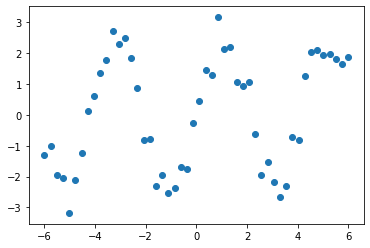

In [57]:
x_data = np.linspace(-6, 6, num=50)
y_data = 2.5 * np.sin(1.5 * x_data) + np.random.normal(size=50) / 2

plt.figure(figsize=(6, 4))
plt.scatter(x_data, y_data)
plt.show()

In [58]:
def test_func(x, a, b):
    return a * np.sin(b * x)

params, params_covariance = optimize.curve_fit(test_func, x_data, y_data,
                                               p0=[2, 2])

print(params)
print(params_covariance)

[2.43221404 1.50400999]
[[8.52484417e-03 9.37512335e-05]
 [9.37512335e-05 1.24792583e-04]]


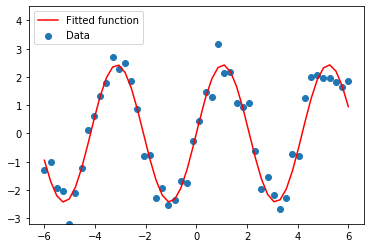

In [59]:
plt.figure()
plt.scatter(x_data, y_data, label='Data')
plt.plot(x_data, test_func(x_data, params[0], params[1]),"r-",
         label='Fitted function')

plt.legend(loc='upper left')
axes = plt.gca()
axes.set_ylim([-3.2,4.5])
plt.show()

### Exponential and power law functions

Fit should be made to the logarithm!

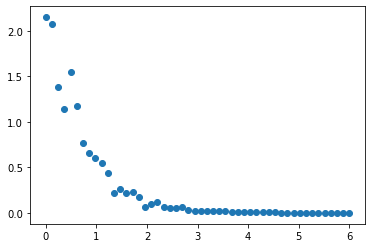

In [60]:
np.random.seed(12345)
x_data = np.linspace(0, 6, num=50)
y_data = 2.5 * np.exp(-1.5 * x_data) * (np.random.normal(size=50) * 0.2 + 0.9)

plt.figure(figsize=(6, 4))
plt.scatter(x_data, y_data)
plt.show()

In [61]:
def test_exp(x, a, b):
    return a * np.exp(b * x)

expfit, params_covariance = optimize.curve_fit(test_exp, x_data, y_data,
                                               p0=[2, 2])

print(expfit)

[ 2.23450974 -1.35675668]


In [62]:
def test_lin(x, a, b):
    return a * x + b

linfit, params_covariance = optimize.curve_fit(test_lin, x_data, np.log(y_data),
                                               p0=[2, 2])

print(linfit[0],np.exp(linfit[1]))

-1.5457669890765926 2.4649024081522715


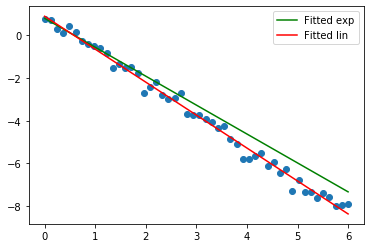

In [63]:
plt.figure(figsize=(6, 4))
plt.scatter(x_data, np.log(y_data))
plt.plot(x_data, np.log(test_exp(x_data, expfit[0], expfit[1])),
         label='Fitted exp',color="green")
plt.plot(x_data, test_lin(x_data, linfit[0], linfit[1]),
         label='Fitted lin',color="red")
plt.legend(loc='upper right')

plt.show()

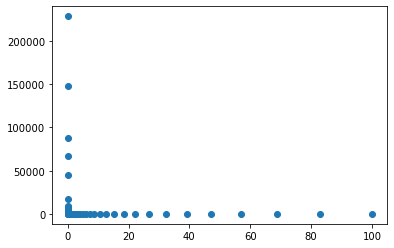

In [64]:
x_data = np.logspace(-2, 2, num=50)
y_data = 2.5 * x_data**(-2.5) * (np.random.normal(size=50) * 0.2 + 0.9)

# And plot it
plt.figure(figsize=(6, 4))
plt.scatter(x_data, y_data)
plt.show()

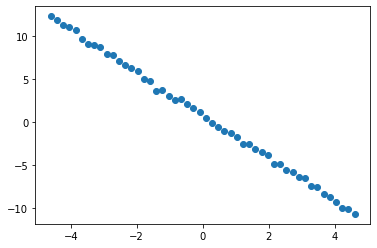

In [65]:
plt.figure(figsize=(6, 4))
plt.scatter(np.log(x_data), np.log(y_data))
plt.show()

Linear fit: -2.485460476514515 2.25950446995976
Power law fit: -2.3933731577750823 3.747613126845662


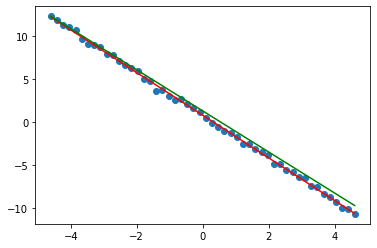

In [66]:
def test_lin(x, a, b):
    return a * x + b
def test_power(x, a, b):
    return b * x**a

linfit, params_covariance = optimize.curve_fit(test_lin, np.log(x_data), np.log(y_data),
                                               p0=[2, 2])
powfit, params_covariance = optimize.curve_fit(test_power, x_data, y_data,
                                               p0=[-2.5, 2])
print("Linear fit:", linfit[0],np.exp(linfit[1]))
print("Power law fit:",powfit[0],powfit[1])
plt.figure(figsize=(6, 4))
plt.scatter(np.log(x_data), np.log(y_data))
plt.plot(np.log(x_data),test_lin(np.log(x_data),linfit[0],linfit[1]),'r-')
plt.plot(np.log(x_data),test_lin(np.log(x_data),powfit[0],np.log(powfit[1])),'g-')
plt.show()

# Error propagation
Source of errors in data:
 * Precision of instrument
 * Human error
 * Stochastic nature of the data/phenomena
 * Environment
 * etc.

Error types:
 * Random
   * Always repeat experiment if possible, to reduce random error (see below)
 * Systematic
   * Repeat the measurent in different environments which may cancel out the systematic error. Vary parameters which may show the direction and magnitutde of the error
   * In general systematic error sucks


## Random errors
Random errors are supposed to have a Normal distribution with a muean $\mu$ and a standard deviation of $\sigma$. If the data reads as $x_1,~x_2,\dots,x_n$, then these quantities are calculated as:
$$
\begin{align*}
\bar x &= \frac{1}{n}\sum_{i=1}^n x_i\cr
\sigma &= \sqrt{\frac{1}{n}\sum_{i=1}^n(x_i-\bar x)^2}
\end{align*}
$$
For sample standard deviation it is costumary to use $n-1$ in the denominators to correct for the downward bias introduced by the concavity of the square root function.
$$
s_x = \sqrt{\frac{1}{n-1}\sum_{i=1}^n(x_i-\bar x)^2}
$$

#### Some customary definitions: 

 * Often we are interested in the <b>standard deviation of the mean</b>:
$$
\sigma_{\bar x}=\sqrt{\frac{1}{n(n-1)}\sum_{i=1}^n(x_i-\bar x)^2}$$
This also indicates that if we measure $n$ data points then the standard deviation of the mean is reduced by $\sqrt{n}$
 * <b>$68$% confidence interval</b>: $\bar x \pm \sigma_{\bar x}$
 * <b>$95$% confidence interval</b>: $\bar x \pm 2\sigma_{\bar x}$
 * <b>$99.7$% confidence interval</b>: $\bar x \pm 3\sigma_{\bar x}$
 * A confidence interval of the mean is a measure of the uncertainty in the estimate of the mean and is generally denoted as $\bar x \pm \Delta x$

The question we would like to answer here is what happens with the variances of different quantities if we apply some arithmetic operations to them.

#### Two variable operations
Any non-linear differentiable function, $f(a,b)$, of two variables, $a$ and $b$, can be expanded as
$$f\approx f^0+\frac{\partial f}{\partial a}a+\frac{\partial f}{\partial b}b.$$
If we take the variance on both sides and use the formula for the variance of a linear combination of variables
$$\operatorname{Var}(aX + bY) = a^2\operatorname{Var}(X) + b^2\operatorname{Var}(Y) + 2ab \operatorname{Cov}(X, Y),$$
then we obtain
$$\sigma^2_f\approx\left| \frac{\partial f}{\partial a}\right| ^2\sigma^2_a+\left| \frac{\partial f}{\partial b}\right|^2\sigma^2_b+2\frac{\partial f}{\partial a}\frac{\partial f} {\partial b}\sigma_{ab},$$
where $\sigma_{f}$ is the standard deviation of the function $f$, $\sigma_{a}$ is the standard deviation of $a$, $\sigma_{b}$ is the standard deviation of $b$ and $\sigma_{ab} = \sigma_{a}\sigma_{b} \rho_{ab}$ is the covariance between $a$ and $b$. If $a$ and $b$ are uncorrelated then $\sigma_{ab}\equiv 0$.

#### Functions
(Only for independent variables)
 * <b>Multipliation by a constant</b>: $f(a)=Ca$: $\sigma_f=|C|\sigma_a$
 * <b>Addition/subtraction:</b> $f(a,b)=a\pm b$: In this case all the derivates are $\pm1$ which translates to $\sigma_f=\sqrt{\sigma_a^2+\sigma_b^2}$. Please note that this translates to the $1/\sqrt{n}$ factor for $n$ independent measurements (the $1/n$ comes from the average).
 * <b>Product/division:</b> $f(a,b)=ab$: $$\sigma_f=|f|\sqrt{\left(\frac{\sigma_a^2}{a}\right)^2+\left(\frac{\sigma_a^2}{b}\right)^2}$$
 * <b>Exponentiation:</b> $f(a)=a^\gamma$: $\sigma_f = |f\gamma \sigma_a/a|$

In [67]:
a = np.random.normal(2,1,100000)
b = np.random.normal(-4,3,100000)

In [68]:
def hist(x,bins=20):
    xmin = x.min()
    xmax = x.max()
    bins = np.linspace(xmin,xmax,bins)
    h,b = np.histogram(x,bins = bins,density=True)
    xpos = (bins[1:]+bins[:-1])/2
    return h,xpos

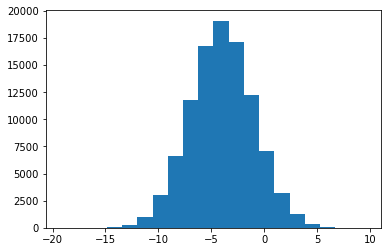

In [69]:

np.histogram(a,bins=20);
plt.hist(b,bins=20);

In [70]:
norm.fit(a),norm.fit(b)

((1.9988695005317234, 1.000950817706907),
 (-3.996924768429706, 2.994250228418076))

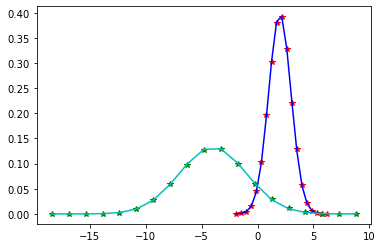

In [71]:
h,x = hist(a)
mua,sa = norm.fit(a)
plt.plot(x,h,"r*");
plt.plot(x,norm.pdf(x, mua, sa),"b-")
h,x = hist(b)
mub,sb = norm.fit(b)
plt.plot(x,h,"g*");
plt.plot(x,norm.pdf(x, mub, sb),"c-")

Measured: -1.9980552678979826 3.159818095235307
Calculated: -1.9980552678979826 3.15712479478557


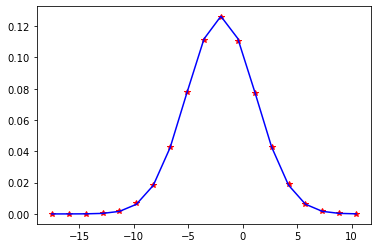

In [72]:
h,x = hist(a+b)
plt.plot(x,h,"r*");
plt.plot(x,norm.pdf(x, mua+mub, np.sqrt(sa**2+sb**2)),"b-")
muab,sab = norm.fit(a+b)
print("Measured:",muab,sab)
print("Calculated:",mua+mub, np.sqrt(sa**2+sb**2))

Measured: 5.99579426896143 3.1544291947550773
Calculated: 5.995794268961429 3.15712479478557


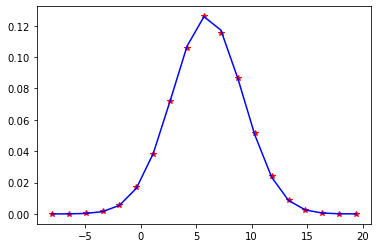

In [73]:
h,x = hist(a-b)
plt.plot(x,h,"r*");
plt.plot(x,norm.pdf(x, mua-mub, np.sqrt(sa**2+sb**2)),"b-")
muab,sab = norm.fit(a-b)
print("Measured:",muab,sab)
print("Calculated:",mua-mub, np.sqrt(sa**2+sb**2))

Measured: -7.980824302970631 7.782577239315108
Calculated: -7.989331015533961 7.199125537180789


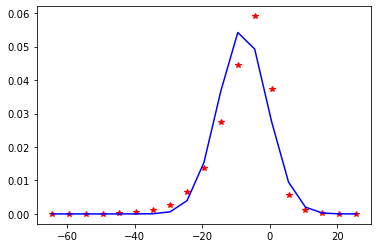

In [74]:
h,x = hist(a*b)
plt.plot(x,h,"r*");
plt.plot(x,norm.pdf(x, mua*mub, np.abs(mua*mub)*np.sqrt((sa/mua)**2+(sb/mub)**2)),"b-")
muab,sab = norm.fit(a*b)
print("Measured:",muab,sab)
print("Calculated:",mua*mub, np.abs(mua*mub)*np.sqrt((sa/mua)**2+(sb/mub)**2))